
# Градиентная оптимизация линейной регрессии при коррелированных признаках и различии масштабов

Этот ноутбук демонстрирует, почему коррелированные признаки и различие масштабов ухудшают поведение градиентной оптимизации и повышают неопределённость оценок в линейной регрессии.


In [1]:
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
import plotly.express as px
from tqdm import tqdm_notebook

In [4]:
def make_data(n=5000, seed=42, case="regular"):
    rng = np.random.default_rng(seed)
    
    if case == "regular":
        rho = 0.0
        cov = np.array([[1.0, rho],[rho, 1.0]])
        X = rng.multivariate_normal([0,0], cov, size=n)
    elif case == "correlated":
        rho = 0.95
        cov = np.array([[1.0, rho],[rho, 1.0]])
        X = rng.multivariate_normal([0,0], cov, size=n)
    elif case == "different_scales":
        x1 = rng.normal(0, 1.0, size=n)
        x2 = rng.normal(0, 100.0, size=n)
        X = np.c_[x1, x2]
    else:
        raise ValueError("unknown case")
    theta_true = np.array([2.0, -1.0])
    y = X @ theta_true + rng.normal(0, 1.0, size=n)
    return X, y, theta_true

In [5]:
def standardize(X):
    mu = X.mean(axis=0, keepdims=True)
    sig = X.std(axis=0, ddof=1, keepdims=True)
    Xs = (X - mu) / sig
    return Xs, mu, sig

In [6]:
def mse_and_grad(theta, X, y):
    r = X @ theta - y
    loss = (r @ r) / (2 * len(y))
    grad = (X.T @ r) / len(y)
    return loss, grad

In [7]:
def grad_descent(X, y, theta0, lr=0.05, steps=80):
    path = [theta0.copy()]
    theta = theta0.copy()
    for _ in range(steps):
        _, g = mse_and_grad(theta, X, y)
        theta -= lr * g
        path.append(theta.copy())
    return np.array(path)

In [8]:
def loss_grid(X, y, grid_lim=5.0, num=120):
    b1 = np.linspace(-grid_lim, grid_lim, num)
    b2 = np.linspace(-grid_lim, grid_lim, num)
    B1, B2 = np.meshgrid(b1, b2)
    L = np.zeros_like(B1)
    for i in range(num):
        for j in range(num):
            theta = np.array([B1[i, j], B2[i, j]])
            L[i, j], _ = mse_and_grad(theta, X, y)
    return B1, B2, L

In [9]:
def ols_covariance(X, y, sigma2=None):
    n = len(y)
    XtX = X.T @ X
    XtX_inv = np.linalg.inv(XtX)
    if sigma2 is None:
        theta_hat = XtX_inv @ X.T @ y
        resid = y - X @ theta_hat
        sigma2 = (resid @ resid) / (n - X.shape[1])
    return sigma2 * XtX_inv

In [10]:
def confidence_ellipse(ax, mean, cov, nsig=2.0, num=200):
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    vals = vals[order]
    vecs = vecs[:, order]
    t = np.linspace(0, 2*np.pi, num)
    circle = np.c_[np.cos(t), np.sin(t)]
    ellipse = (circle @ np.diag(np.sqrt(vals)) @ vecs.T) * nsig + mean
    ax.plot(ellipse[:,0], ellipse[:,1])
    ax.scatter([mean[0]], [mean[1]])
    ax.set_xlabel("$\\theta_1$")
    ax.set_ylabel("$\\theta_2$")
    ax.set_aspect("equal", adjustable="box")

## Обычный ("правильный") случай: низкая корреляция признаков, схожий масштаб признаков

In [11]:
title, key, lr, steps, lim = "\"Правильные данные\"", "regular", 0.05, 80, 5.0

In [12]:
X, y, theta_true = make_data(case=key)

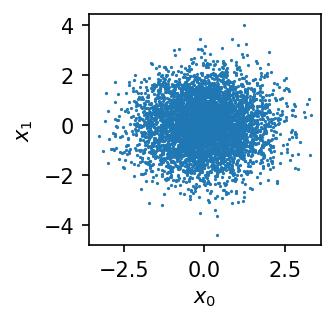

In [13]:
f = plt.figure(figsize=(2,2), dpi=150)
plt.scatter(X[:,0], X[:, 1], s=0.3)
plt.xlabel("$x_0$")
plt.ylabel("$x_1$")
plt.show()

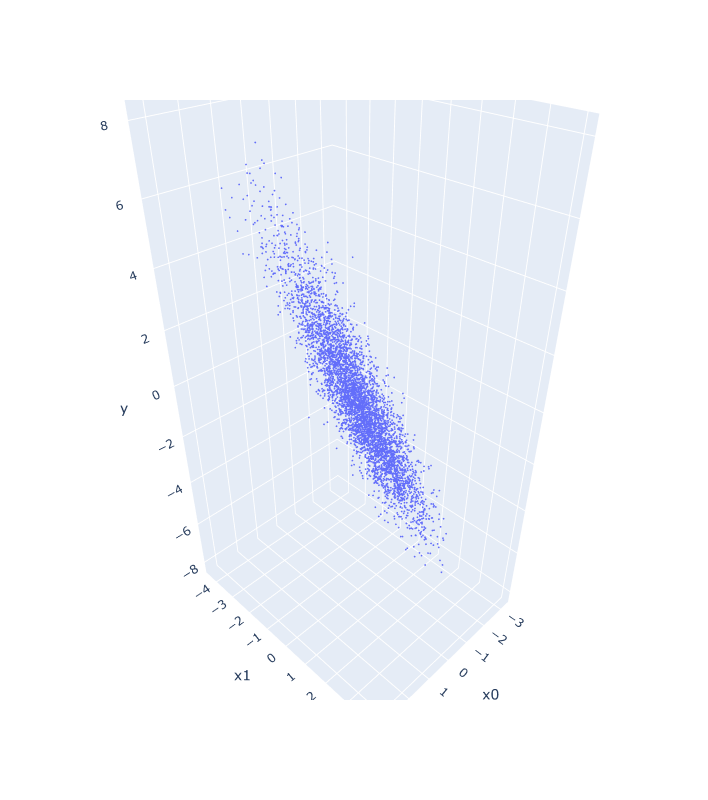

In [14]:
fig = go.Figure(data=[go.Scatter3d(x=X[:,0],
                                   y=X[:,1],
                                   z=y,
                                   mode='markers',
                                   marker=dict(size=1))
                     ])
fig.update_layout(autosize=False,
                  width=800,
                  height=800,
                  margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
                  scene = dict(xaxis_title='x0',
                               yaxis_title='x1',
                               zaxis_title='y'))
fig.show()

In [15]:
B1, B2, L = loss_grid(X, y, grid_lim=lim, num=120)

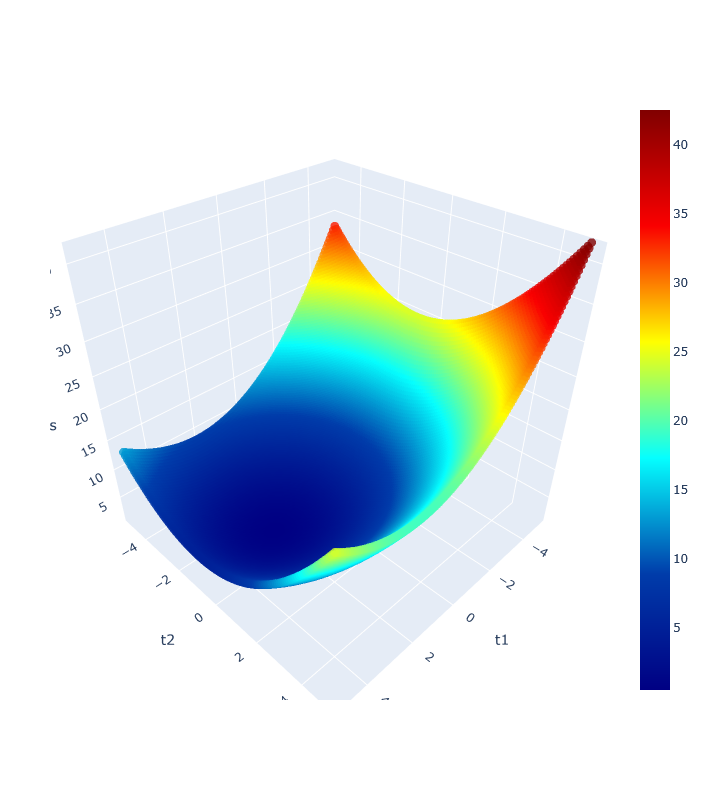

In [16]:
fig = go.Figure(data=[go.Scatter3d(x = B1.ravel(),
                                   y = B2.ravel(),
                                   z = L.ravel(),
                                   mode='markers',
                                   marker=dict(size=5,
                                               color=L.ravel(),
                                               colorscale='jet',
                                               showscale=True,
                                               opacity=0.8))
                     ])
fig.update_layout(autosize=False,
                  width=800,
                  height=800,
                  margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
                  yaxis = dict(scaleanchor = "x",
                               scaleratio = 1),
                  scene = dict(aspectmode='cube',
                               xaxis = dict(title='t1'),
                               yaxis = dict(title='t2'),
                               zaxis = dict(title='loss', range = [L.min(),
                                                                   L.max()])))
# fig.show()

In [17]:
paths = []
for i in range(100):
    path = grad_descent(X, y, theta0=np.random.rand(2)*8.0 - 4.0, lr=lr, steps=steps)
    paths.append(path)

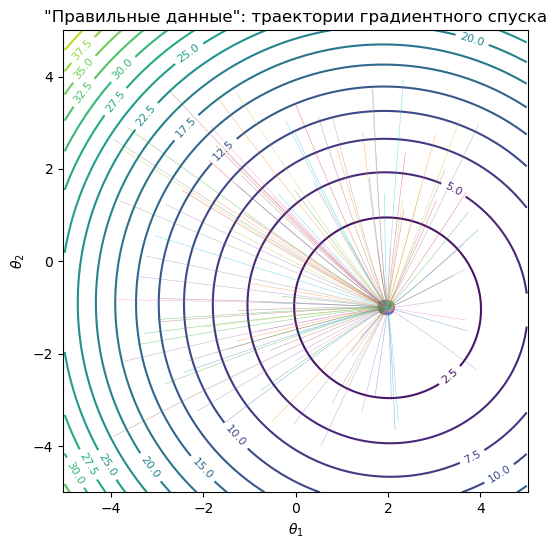

In [18]:
plt.figure(figsize=(6,6))
cs = plt.contour(B1, B2, L, levels=20)
plt.clabel(cs, inline=True, fontsize=8)
for i in range(100):
    path = paths[i]
    plt.plot(path[:,0], path[:,1], linewidth = 0.4, alpha = 0.5)
    plt.scatter(path[-1,0], path[-1,1])
plt.axis('equal')
plt.title(f"{title}: траектории градиентного спуска")
plt.xlabel("$\\theta_1$")
plt.ylabel("$\\theta_2$")
plt.show()

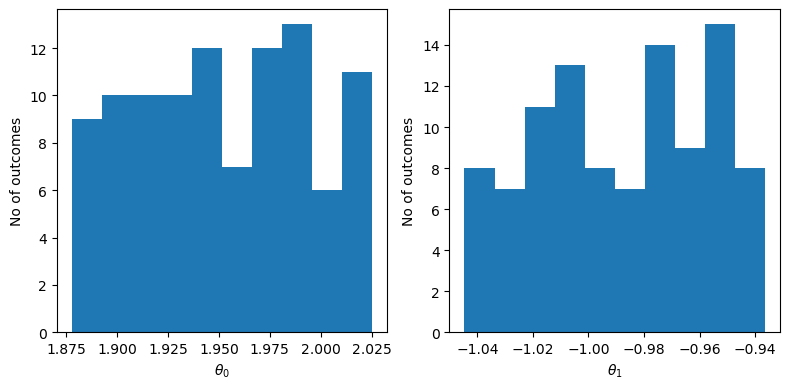

In [19]:
f = plt.figure(figsize=(8,4))
_ = plt.subplot(1,2,1)
plt.hist([t[-1,0] for t in paths])
plt.xlabel('$\\theta_0$')
plt.ylabel('No of outcomes')

_ = plt.subplot(1,2,2)
plt.hist([t[-1,1] for t in paths])
plt.xlabel('$\\theta_1$')
plt.ylabel('No of outcomes')
plt.tight_layout()

plt.show()

## Высокая корреляция признаков

In [20]:
title, key, lr, steps, lim = "Сильная корреляция признаков", "correlated", 0.05, 80, 5.0

In [21]:
X, y, theta_true = make_data(case=key)

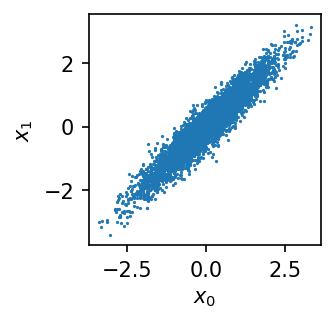

In [22]:
f = plt.figure(figsize=(2,2), dpi=150)
plt.scatter(X[:,0], X[:, 1], s=0.3)
plt.xlabel("$x_0$")
plt.ylabel("$x_1$")
plt.show()

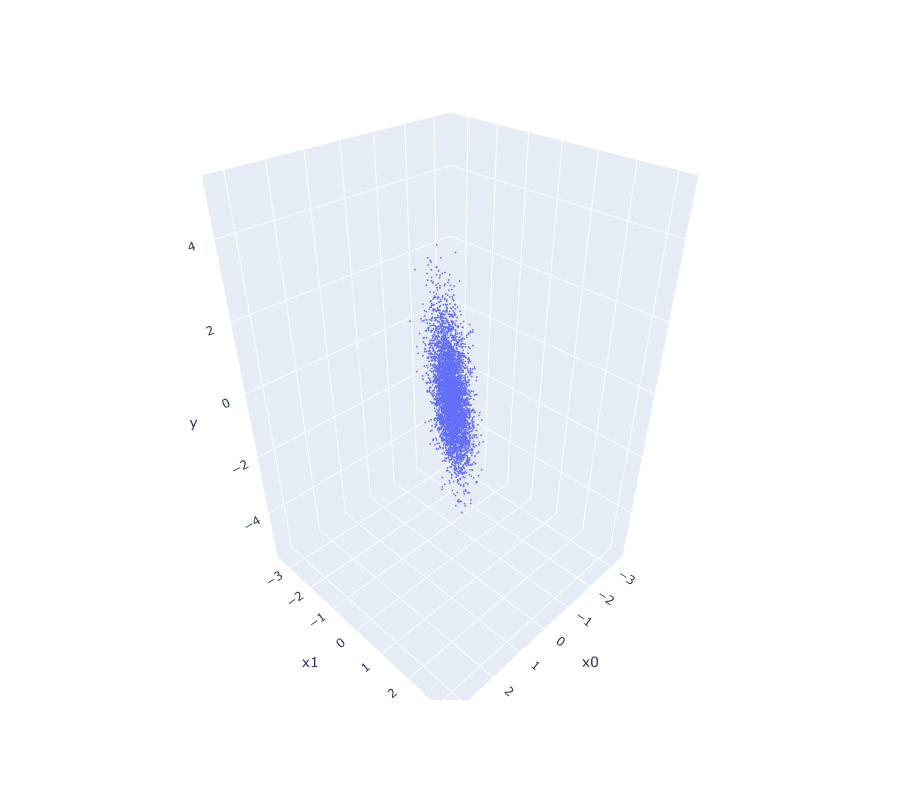

In [23]:
fig = go.Figure(data=[go.Scatter3d(x=X[:,0],
                                   y=X[:,1],
                                   z=y,
                                   mode='markers',
                                   marker=dict(size=1))
                     ])
fig.update_layout(autosize=False,
                  width=800,
                  height=800,
                  margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
                  scene = dict(xaxis_title='x0',
                               yaxis_title='x1',
                               zaxis_title='y'))
fig.show()

In [24]:
B1, B2, L = loss_grid(X, y, grid_lim=lim, num=120)

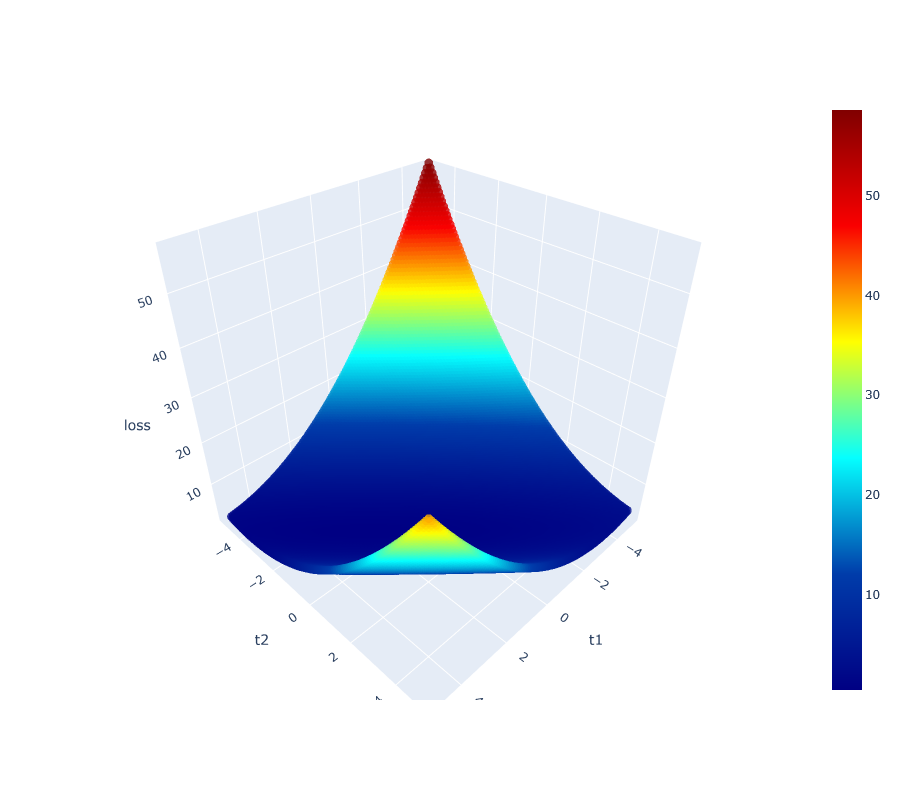

In [25]:
fig = go.Figure(data=[go.Scatter3d(x = B1.ravel(),
                                   y = B2.ravel(),
                                   z = L.ravel(),
                                   mode='markers',
                                   marker=dict(size=5,
                                               color=L.ravel(),
                                               colorscale='jet',
                                               showscale=True,
                                               opacity=0.8))
                     ])
fig.update_layout(autosize=False,
                  width=800,
                  height=800,
                  margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
                  yaxis = dict(scaleanchor = "x",
                               scaleratio = 1),
                  scene = dict(aspectmode='cube',
                               xaxis = dict(title='t1'),
                               yaxis = dict(title='t2'),
                               zaxis = dict(title='loss', range = [L.min(),
                                                                   L.max()])))
fig.show()

In [26]:
paths = []
for i in range(100):
    path = grad_descent(X, y, theta0=np.random.rand(2)*8.0 - 4.0, lr=lr, steps=steps)
    paths.append(path)

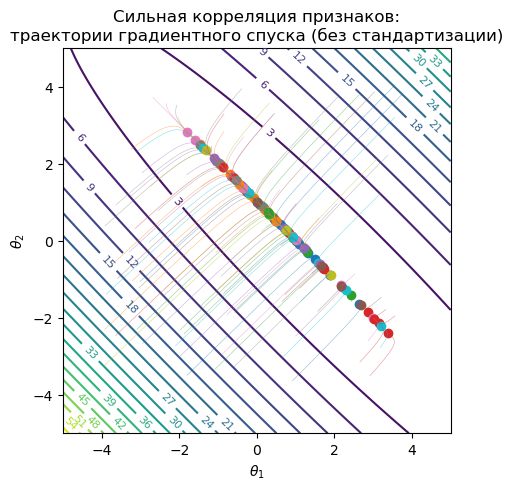

In [27]:
plt.figure(figsize=(5,5))
cs = plt.contour(B1, B2, L, levels=20)
plt.clabel(cs, inline=True, fontsize=8)
for i in range(100):
    path = paths[i]
    plt.plot(path[:,0], path[:,1], linewidth = 0.4, alpha = 0.5)
    plt.scatter(path[-1,0], path[-1,1])
plt.title(f"{title}:\nтраектории градиентного спуска (без стандартизации)")
plt.xlabel("$\\theta_1$")
plt.ylabel("$\\theta_2$")
plt.show()

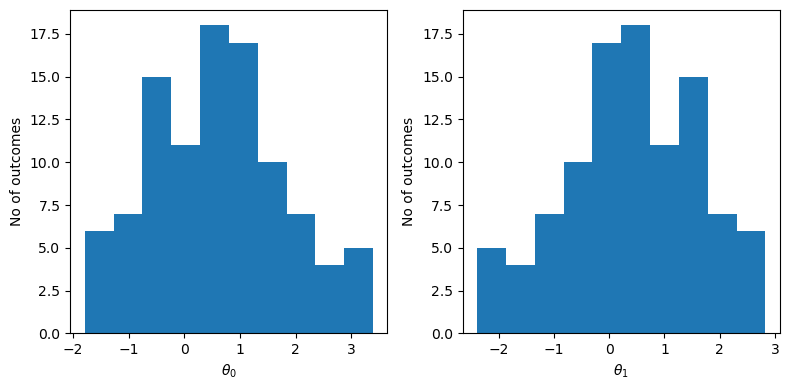

In [28]:
f = plt.figure(figsize=(8,4))
_ = plt.subplot(1,2,1)
plt.hist([t[-1,0] for t in paths])
plt.xlabel('$\\theta_0$')
plt.ylabel('No of outcomes')

_ = plt.subplot(1,2,2)
plt.hist([t[-1,1] for t in paths])
plt.xlabel('$\\theta_1$')
plt.ylabel('No of outcomes')
plt.tight_layout()

plt.show()

In [29]:
title, key, lr, steps, lim = "Существенно различные масштабы признаков", "different_scales", 1e-6, 6000, 5.0

In [30]:
X, y, theta_true = make_data(case=key)

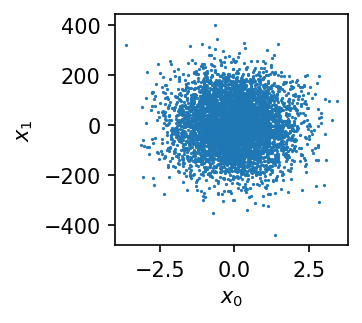

In [31]:
f = plt.figure(figsize=(2,2), dpi=150)
plt.scatter(X[:,0], X[:, 1], s=0.3)
plt.xlabel("$x_0$")
plt.ylabel("$x_1$")
plt.show()

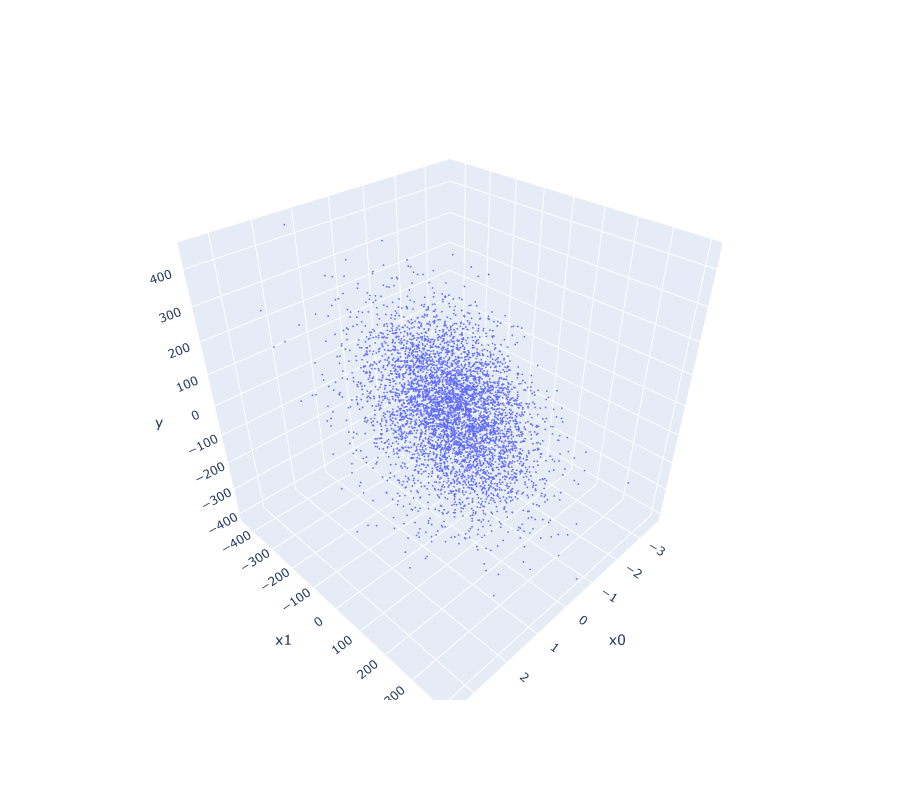

In [32]:
fig = go.Figure(data=[go.Scatter3d(x=X[:,0],
                                   y=X[:,1],
                                   z=y,
                                   mode='markers',
                                   marker=dict(size=1))
                     ])
fig.update_layout(autosize=False,
                  width=800,
                  height=800,
                  margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
                  scene = dict(xaxis_title='x0',
                               yaxis_title='x1',
                               zaxis_title='y'))
fig.show()

In [33]:
B1, B2, L = loss_grid(X, y, grid_lim=lim, num=120)

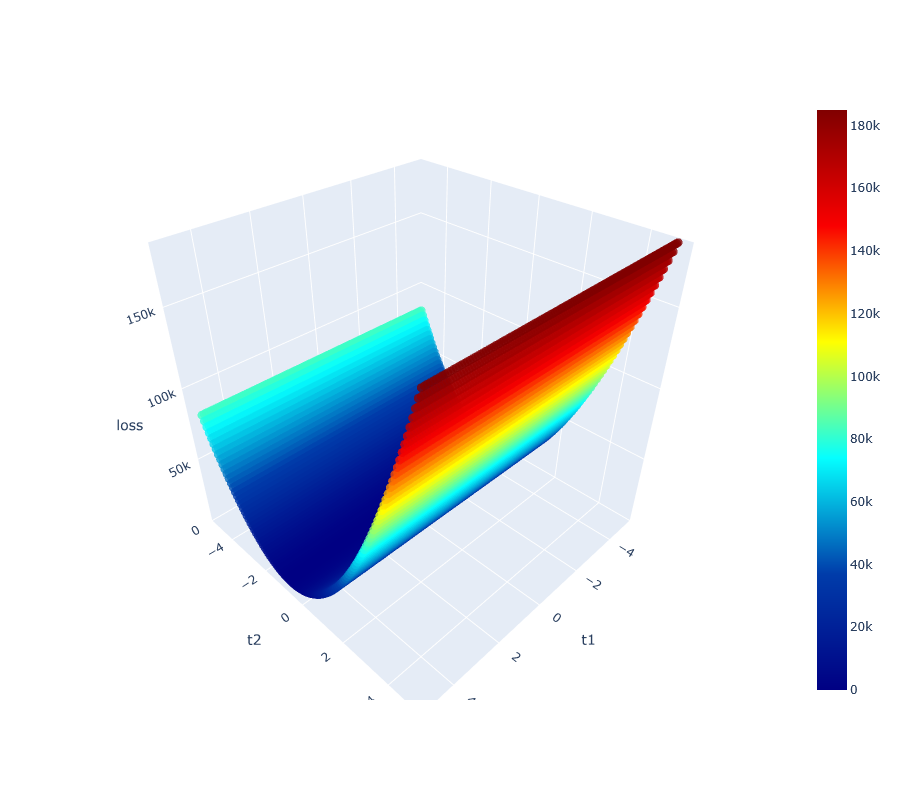

In [34]:
fig = go.Figure(data=[go.Scatter3d(x = B1.ravel(),
                                   y = B2.ravel(),
                                   z = L.ravel(),
                                   mode='markers',
                                   marker=dict(size=5,
                                               color=L.ravel(),
                                               colorscale='jet',
                                               showscale=True,
                                               opacity=0.8))
                     ])
fig.update_layout(autosize=False,
                  width=800,
                  height=800,
                  margin=go.layout.Margin(l=50, r=50, b=100, t=100, pad=4),
                  yaxis = dict(scaleanchor = "x",
                               scaleratio = 1),
                  scene = dict(aspectmode='cube',
                               xaxis = dict(title='t1'),
                               yaxis = dict(title='t2'),
                               zaxis = dict(title='loss', range = [L.min(),
                                                                   L.max()])))
fig.show()

In [35]:
paths = []
for i in tqdm_notebook(range(100), total=100):
    path = grad_descent(X, y, theta0=np.random.rand(2)*8.0 - 4.0, lr=lr, steps=steps)
    paths.append(path)

  0%|          | 0/100 [00:00<?, ?it/s]

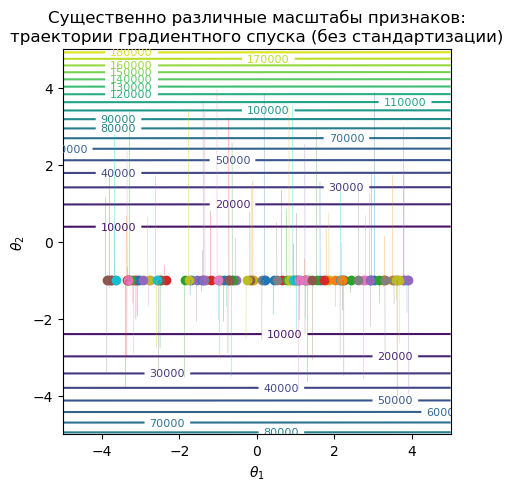

In [36]:
plt.figure(figsize=(5,5))
cs = plt.contour(B1, B2, L, levels=20)
plt.clabel(cs, inline=True, fontsize=8)
for i in range(100):
    path = paths[i]
    plt.plot(path[:,0], path[:,1], linewidth = 0.4, alpha = 0.5)
    plt.scatter(path[-1,0], path[-1,1])
plt.title(f"{title}:\nтраектории градиентного спуска (без стандартизации)")
plt.xlabel("$\\theta_1$")
plt.ylabel("$\\theta_2$")
plt.show()

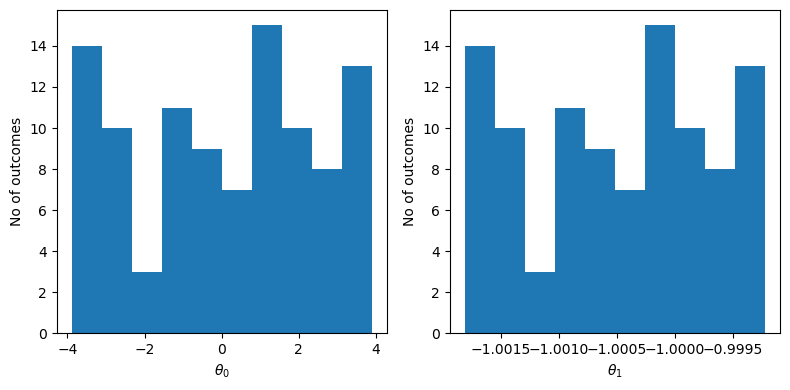

In [37]:
f = plt.figure(figsize=(8,4))
_ = plt.subplot(1,2,1)
plt.hist([t[-1,0] for t in paths])
plt.xlabel('$\\theta_0$')
plt.ylabel('No of outcomes')

_ = plt.subplot(1,2,2)
plt.hist([t[-1,1] for t in paths])
plt.xlabel('$\\theta_1$')
plt.ylabel('No of outcomes')
plt.tight_layout()

plt.show()


### Выводы
- Без нормирования при больших различиях масштабов шаги вдоль «крутого» направления приводят к сильным колебаниям или необходимости крайне малого шага обучения.
- Стандартизация делает уровни MSE более изотропными и траекторию спуска значительно короче.
- Плохая обусловленность $X^T X$ приводит к росту неопределённости оценок параметров => целевой переменной